In [66]:
#!pip install osgeo
import geopandas as gpd
import pandas as pd
#from osgeo import gdal
#gdal.SetConfigOption('SHAPE_RESTORE_SHX', 'YES')
#in_vector = '../data/station_stop/stationstop.shp'
# メッシュ境界
mesh_gdf = gpd.read_file("../data/mesh/神奈川/merged_mesh.shp")

# 人口デー
#pop_df = pd.read_table("../data/poplation/人口.txt", encoding="shift-jis", sep=",",header=1)
#pop_df.rename(columns={"Unnamed: 0":"KEY_CODE"}, inplace=True)
#pop_df["KEY_CODE"] = pop_df["KEY_CODE"].astype(str)
# 駅とバス停
station_stop_gdf = gpd.read_file("../data/station_stop/stationstop.shp")
#bus_stop_gdf = gpd.read_file("../data/bus_stop/busstop.shp")

In [ ]:
# 必要な人口メッシュだけ抽出（500人以上）
target_mesh = mesh_gdf.merge(pop_df, left_on="KEY_CODE", right_on="KEY_CODE")
target_mesh = target_mesh[target_mesh[target_mesh.columns[10]] >= 500]

# 駅・バス停からの距離（500m/200m以上）
from shapely.geometry import Point
from shapely.ops import nearest_points

# 空間インデックスで距離計算高速化するのがコツ
# 各メッシュの中心点を作成して、距離計算
target_mesh["center"] = target_mesh.geometry.centroid

# 駅から500m以上 && バス停から200m以上 なら "不便地域"
# → この部分一緒にコーディングできます


/tmp/ipykernel_1221/469439105.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  target_mesh["center"] = target_mesh.geometry.centroid


In [45]:
import folium
from IPython.display import display

# Display the map in the Jupyter Notebook
display(m)
from folium.plugins import MarkerCluster

m = folium.Map(location=[35.33, 139.49], zoom_start=12)

# 不便地域のポリゴン表示
folium.GeoJson(target_mesh.geometry).add_to(m)

# 駅・バス停マーカー
for idx, row in station_gdf.iterrows():
    folium.CircleMarker(location=[row.geometry.coords[0][1], row.geometry.coords[0][0]], radius=2, color="blue").add_to(m)

for idx, row in busstop_gdf.iterrows():
    folium.CircleMarker(location=[row.geometry.y, row.geometry.x], radius=2, color="green").add_to(m)

#m.save("notebook/visualization_mockup.html")


In [47]:
import geopandas as pd
import shapely

# 経済物理分析

In [12]:
import pandas as pd
pop_df = pd.read_table("../data/tblT001101H5238.txt", encoding="shift-jis", sep=",",header=1)
pop_df.rename(columns={"Unnamed: 0":"KEY_CODE"}, inplace=True)
ccdf_plot_6 = pd.DataFrame()
ccdf_plot_6["人口総数"] = pop_df[pop_df.columns[4]]
ccdf_plot_6["人口総数_cdf"] = pop_df[pop_df.columns[4]] / pop_df[pop_df.columns[4]].sum()
ccdf_plot_6 = ccdf_plot_6.sort_values(by="人口総数")
ccdf_plot_6["人口総数_cumsum"] = ccdf_plot_6.cumsum()["人口総数_cdf"]
ccdf_plot_6["人口総数_ccdf"] = 1 - ccdf_plot_6["人口総数_cumsum"]

In [11]:
pop_df.columns[4]

'\u3000人口（総数）'

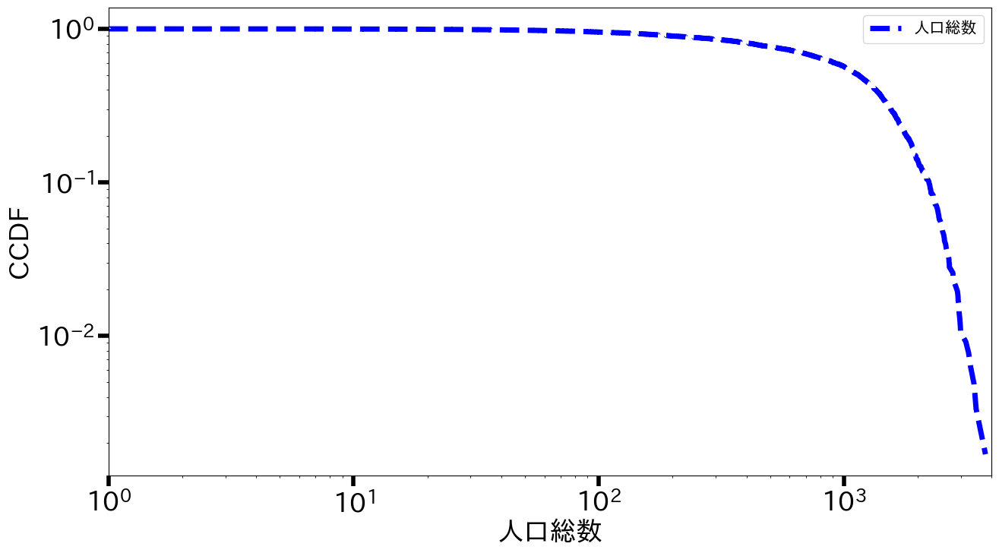

In [ ]:
#!pip install japanize-matplotlib
import matplotlib.pyplot as plt
import japanize_matplotlib
# 人口の相補累積分布関数を作成
plt.figure(figsize=(15,8))

#ccdf_plot
plt.plot(ccdf_plot_6["人口総数"][:-1],ccdf_plot_6["人口総数_ccdf"][:-1],color='blue', label='人口総数', lw=5,ls="--")
# 6_人口総数
#plt.plot(all_txt_6["人口総数"],all_txt_6["ccdf"],color='blue', label='人口総数', lw=5,ls="--")
# 7_人口男
#plt.plot(ccdf_plot_7["人口男"],ccdf_plot_7["人口男_ccdf"],color='blue', label='人口男', lw=5,)

# 8_人口女
#plt.plot(ccdf_plot_8["人口女"],ccdf_plot_8["人口女_ccdf"],color='red', label='人口女', lw=5,)


# 11_０〜１４歳人口総数
#plt.plot(ccdf_plot_11["０〜１４歳人口総数"],ccdf_plot_11["０〜１４歳人口総数_ccdf"],color='y', label='０〜１４歳人口総数', lw=5,)

# 12_１５〜６４歳人口総数
#plt.plot(ccdf_plot_12["１５〜６４歳人口総数"],ccdf_plot_12["１５〜６４歳人口総数_ccdf"],color='magenta', label='１５〜６４歳人口総数', lw=5,ls=":")

# 13_6５歳以上人口総数
#plt.plot(ccdf_plot_13["６５歳以上人口総数"],ccdf_plot_13["６５歳以上人口総数_ccdf"],color='lightblue', label='６５歳以上人口総数', lw=5,ls="-.")

# 14_７５歳以上人口総数
#plt.plot(ccdf_plot_14["７５歳以上人口総数"],ccdf_plot_14["７５歳以上人口総数_ccdf"],color='black', label='７５歳以上人口総数', lw=5,ls=":")

# 15_８５歳以上人口総数
#plt.plot(ccdf_plot_15["８５歳以上人口総数"],ccdf_plot_15["８５歳以上人口総数_ccdf"],color='gray', label='８５歳以上人口総数', lw=5,ls="--")

plt.xscale('log')
plt.yscale('log')

plt.xlim(1, 4000) #xmin
#plt.ylim(10**-7,1)
plt.xlabel('人口総数', fontsize = 25)
plt.ylabel('CCDF', fontsize = 25)
plt.tick_params(labelsize = 25,width = 4, length = 10)
plt.minorticks_on()
plt.legend(loc='upper right', fontsize = 15)


In [ ]:
# ヒュニベの公式
def HuybenyDistanece(point_a, point_b):
    a_rad_lat = math.radians(point_a[0]) #変数を度からラジアンに変換 latitude(緯度変換)
    a_rad_lon = math.radians(point_a[1])
    b_rad_lat = math.radians(point_b[0])
    b_rad_lon = math.radians(point_b[0])
    m_lat = (a_rad_lat + b_rad_lat) / 2 # 平均緯度
    d_lat = a_rad_lat - b_rad_lat # 緯度差
    d_lon = a_rad_lon - b_rad_lon # 経度差
    W = math.sqrt(1-E2*math.pow(math.sin(m_lat),2))
    M = EQUATOR_RADIUS*(1-E2) / math.pow(W, 3) # 子午線曲率半径
    N = EQUATOR_RADIUS / W # 卯酉線曲率半径
    # d = math.sqrt(math.pow(M*d_lat,2) + math.pow(N*d_lon*math.cos(m_lat),2) + math.pow(point_a.altitude-point_b.altitude,2))
    d = math.sqrt(math.pow(M*d_lat,2) + math.pow(N*d_lon*math.cos(m_lat),2))
    return d

In [ ]:
# にている施設の発見をするなど？

In [38]:
# 駅の分析
station_point_gdf = gpd.read_file("../data/N02-22_GML/utf8/N02-22_Station.shp", encoding="utf-8")
station_point_gdf

,N02_001,N02_002,N02_003,N02_004,N02_005,N02_005c,N02_005g,geometry
0,11,2,指宿枕崎線,九州旅客鉄道,二月田,010112,010112,"LINESTRING (130.63035 31.25405, 130.62985 31.2..."
1,23,5,沖縄都市モノレール線,沖縄都市モノレール,古島,010127,010127,"LINESTRING (127.70279 26.23035, 127.70309 26.2..."
2,24,5,東京臨海新交通臨海線,ゆりかもめ,お台場海浜公園,004091,004091,"LINESTRING (139.77818 35.62961, 139.77888 35.63)"
3,24,5,東京臨海新交通臨海線,ゆりかもめ,東京国際クルーズターミナル,004128,004128,"LINESTRING (139.77333 35.62109, 139.77288 35.6..."
4,24,5,東京臨海新交通臨海線,ゆりかもめ,テレコムセンター,004144,004144,"LINESTRING (139.78001 35.61791, 139.77932 35.6..."
...,...,...,...,...,...,...,...,...
10215,11,1,西九州新幹線,九州旅客鉄道,嬉野温泉,009578,009578,"LINESTRING (129.99896 33.10578, 129.99895 33.1..."
10216,11,1,西九州新幹線,九州旅客鉄道,武雄温泉,009521,009518,"LINESTRING (130.02224 33.19575, 130.02392 33.1..."
10217,11,2,大村線,九州旅客鉄道,新大村,009650,009648,"LINESTRING (129.95705 32.93278, 129.95745 32.9..."
10218,12,5,あいの風とやま鉄道線,あいの風とやま鉄道,新富山口,001898,001898,"LINESTRING (137.24023 36.71916, 137.24056 36.7..."


In [ ]:
# 人口とバス停の数でスケーリング法の発見をする

In [29]:
busstop_gdf = gpd.read_file("../data/P11-22_14_SHP/P11-22_14.shp")
busstop_gdf

/usr/local/lib/python3.10/site-packages/pyogrio/raw.py:198: RuntimeWarning: One or several characters couldn't be converted correctly from SJIS to UTF-8.  This warning will not be emitted anymore
  return ogr_read(


,P11_001,P11_002,P11_003_01,P11_003_02,P11_003_03,P11_003_04,P11_003_05,P11_003_06,P11_003_07,P11_003_08,...,P11_004_28,P11_004_29,P11_004_30,P11_004_31,P11_004_32,P11_004_33,P11_004_34,P11_004_35,P11_005,geometry
0,石楯尾神社前,富士急バス（株）,【上野原】上野原駅〜バイパス〜井戸,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.11941 35.65669)
1,上岩,富士急バス（株）,【上野原】上野原駅〜バイパス〜井戸,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.12011 35.65348)
2,上岩下,富士急バス（株）,【上野原】上野原駅〜バイパス〜井戸,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.12066 35.65227)
3,和田,神奈川中央交通西（株）,野08,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.1488 35.65134)
4,岩中野,富士急バス（株）,【上野原】上野原駅〜バイパス〜井戸,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.12133 35.65086)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10701,晴海町,京浜急行バス（株）,三8・東18,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.62414 35.13933)
10702,通り矢,京浜急行バス（株）,三8・東18,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.6268 35.13822)
10703,城ケ島,京浜急行バス（株）,"三9・三26,東14,東19",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.61265 35.13656)
10704,城ケ島漁港前,京浜急行バス（株）,"三9・三26,東14,東19",None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (139.61815 35.13549)


In [31]:
busrout_gdf = gpd.read_file("../data/bus_rout/N07-22.shp")
busrout_gdf

,N07_001,N07_002,geometry
0,日ノ丸自動車（株）,None,"LINESTRING (134.3262 35.44066, 134.32621 35.44..."
1,日ノ丸自動車（株）,None,"LINESTRING (134.3262 35.44066, 134.32621 35.44..."
2,あいあいバス運行協会,None,"LINESTRING (135.66096 35.48307, 135.66091 35.4..."
3,上八万バス運営委員会,None,"LINESTRING (134.49069 34.03236, 134.49064 34.0..."
4,上八万バス運営委員会,None,"LINESTRING (134.52183 34.04238, 134.52178 34.0..."
...,...,...,...
353448,鯖江市,None,"LINESTRING (136.24161 35.95234, 136.24143 35.9..."
353449,南越前町,None,"LINESTRING (136.03899 35.85059, 136.03926 35.8..."
353450,日本交通（株）,None,"LINESTRING (134.21618 35.52213, 134.2159 35.52..."
353451,鳥取市,None,"LINESTRING (134.04016 35.4637, 134.0415 35.463..."


In [39]:
station_line_gdf = gpd.read_file("../data/train_rout/N02-22_RailroadSection.shp")

In [40]:
station_line_gdf

,N02_001,N02_002,N02_003,N02_004,geometry
0,23,5,沖縄都市モノレール線,沖縄都市モノレール,"LINESTRING (127.67948 26.21454, 127.6797 26.21..."
1,12,5,いわて銀河鉄道線,アイジーアールいわて銀河鉄道,"LINESTRING (141.29139 40.3374, 141.29176 40.33..."
2,12,5,いわて銀河鉄道線,アイジーアールいわて銀河鉄道,"LINESTRING (141.27554 40.23936, 141.27567 40.2..."
3,12,5,いわて銀河鉄道線,アイジーアールいわて銀河鉄道,"LINESTRING (141.28659 40.26092, 141.28538 40.2..."
4,12,5,いわて銀河鉄道線,アイジーアールいわて銀河鉄道,"LINESTRING (141.29082 40.28615, 141.29089 40.2..."
...,...,...,...,...,...
21911,12,5,あいの風とやま鉄道線,あいの風とやま鉄道,"LINESTRING (137.24023 36.71916, 137.24056 36.7..."
21912,12,5,あいの風とやま鉄道線,あいの風とやま鉄道,"LINESTRING (137.24056 36.71999, 137.24071 36.7..."
21913,11,2,宗谷線,北海道旅客鉄道,"LINESTRING (142.46548 44.33083, 142.46548 44.3..."
21914,11,2,札沼線,北海道旅客鉄道,"LINESTRING (141.44875 43.1896, 141.44622 43.18..."


ノード数: 20902
エッジ数: 9666


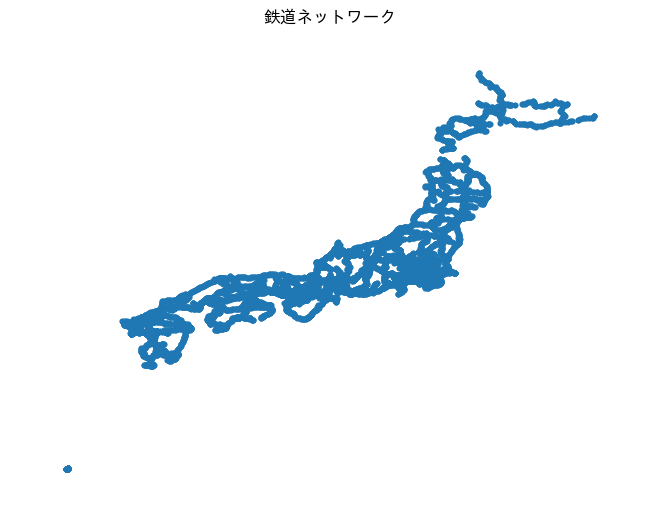

In [41]:
import geopandas as gpd
import networkx as nx
from shapely.geometry import Point
# 2. グラフ初期化（無向グラフ）
G = nx.Graph()

# 3. ノード（駅）を作成：station_line_gdf から始点・終点をノードとして抽出
for idx, row in station_line_gdf.iterrows():
    line = row.geometry
    start_point = Point(line.coords[0])
    end_point = Point(line.coords[-1])

    # 駅名がなくても座標を文字列にしてノードとして扱う
    G.add_node((start_point.x, start_point.y), geometry=start_point)
    G.add_node((end_point.x, end_point.y), geometry=end_point)

# 4. エッジ（駅間の路線）を追加：station_point_gdf のジオメトリをエッジに
for idx, row in station_point_gdf.iterrows():
    line = row.geometry
    start = line.coords[0]
    end = line.coords[-1]

    start_node = (start[0], start[1])
    end_node = (end[0], end[1])
    line_name = row["N02_003"]
    station_name = row["N02_005"]

    G.add_edge(start_node, end_node, line_name=line_name, station_name=station_name, geometry=line)

# 5. ノード・エッジ数を表示
print(f"ノード数: {G.number_of_nodes()}")
print(f"エッジ数: {G.number_of_edges()}")

# 6. 可視化（簡易）
import matplotlib.pyplot as plt

pos = {node: node for node in G.nodes}
nx.draw(G, pos, node_size=10, edge_color='gray')
plt.title("鉄道ネットワーク")
plt.show()

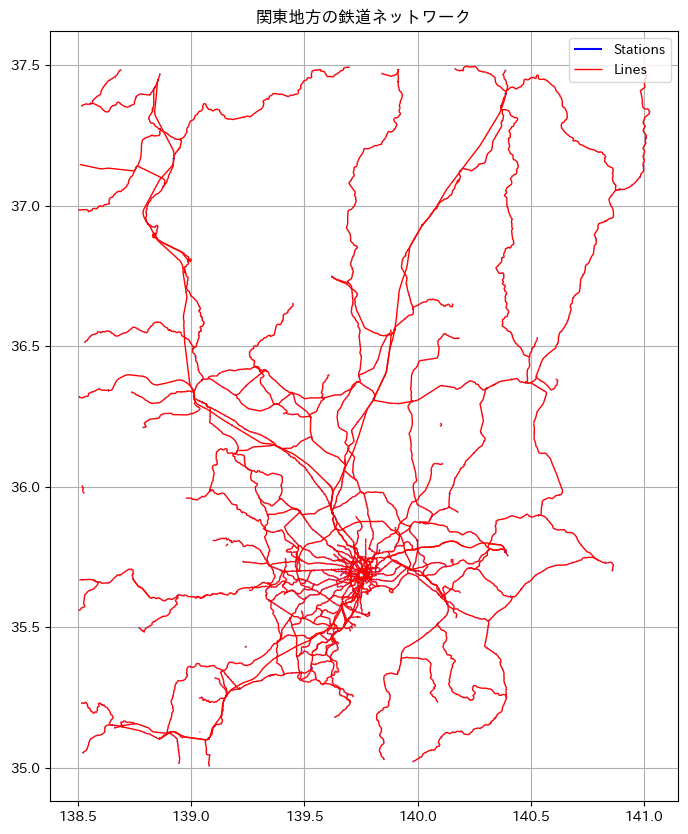

In [42]:
# 関東地方の緯度経度範囲
min_lat, max_lat = 35.0, 37.5
min_lon, max_lon = 138.5, 141.5

# 関東地方のバウンディングボックスを作成
from shapely.geometry import box
kanto_bbox = box(min_lon, min_lat, max_lon, max_lat)

# 関東地方のデータを抽出
station_point_kanto = station_point_gdf[station_point_gdf.geometry.within(kanto_bbox)]
station_line_kanto = station_line_gdf[station_line_gdf.geometry.within(kanto_bbox)]

import matplotlib.pyplot as plt

# 描画
fig, ax = plt.subplots(figsize=(10, 10))

# 駅のポイントを描画
station_point_kanto.plot(ax=ax, color='blue', markersize=10, label='Stations')

# 路線を描画
station_line_kanto.plot(ax=ax, color='red', linewidth=1, label='Lines')

# 凡例を表示
plt.legend()

# タイトルを設定
plt.title('関東地方の鉄道ネットワーク')

# グリッドを表示
plt.grid(True)

# 描画
plt.show()


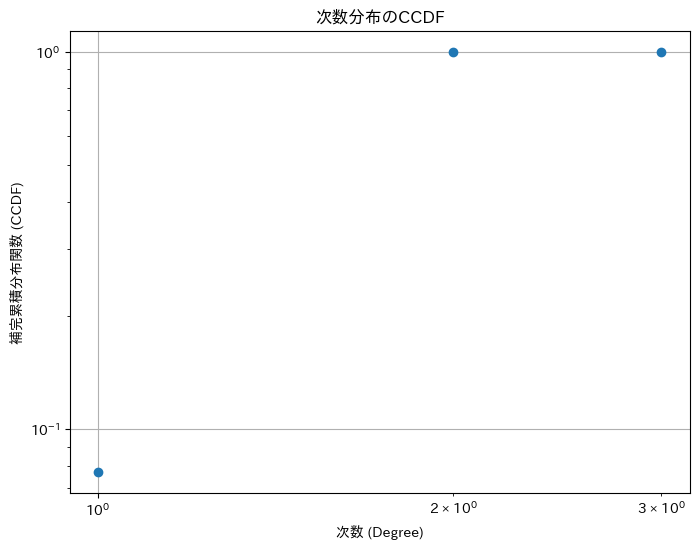

ModuleNotFoundError: No module named 'scipy'

<Figure size 1200x1200 with 0 Axes>

In [43]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import collections

# 1. グラフの構築
# station_point_gdfとstation_line_gdfからグラフGを構築するコードがここに入ります。
# 以前の回答で示した方法でGを構築してください。

# 2. 次数分布のCCDFを描画
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degree_count = collections.Counter(degree_sequence)
deg, cnt = zip(*degree_count.items())

# CCDFの計算
cnt = np.array(cnt)
ccdf = 1 - np.cumsum(cnt) / sum(cnt)

plt.figure(figsize=(8, 6))
plt.loglog(deg, ccdf, marker="o", linestyle="none")
plt.xlabel("次数 (Degree)")
plt.ylabel("補完累積分布関数 (CCDF)")
plt.title("次数分布のCCDF")
plt.grid(True)
plt.show()

# 3. 媒介中心性に基づいてノードサイズを調整して描画
betweenness = nx.betweenness_centrality(G)

# ノードサイズの正規化
node_size = [v * 1000 for v in betweenness.values()]

plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color="blue", alpha=0.6)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title("媒介中心性に基づくノードサイズの調整")
plt.show()
